### Week 7 Assignment: Construction in Inglewood from 1950-2020

In this notebook, I attempt to conduct spatial autocorrelation for the areas that have experienced the most constructions between 1950-2020. I use this wide range of years for this assignemnt to get an idea for the entire of City of Inglewood, and depending on the findings, I might limit the years so that it is most relevant to the current times. 

I will be using census block data for income and I will also be using the data from the LA County Assessor. I might need more time after this week to incorporate the income aspect of this research, but for now I at least want to see the blocks that have experienced the most construction.

For the midterm we found that there was very little change to the physical aspect of the City between 2010-2020, so for the final we hope to dive deepeer into other potential factors such as social demogrpahic changes, while also being able to link it to physical attributes such as year built or effective year built. This notebook will focus on the year built aspect of this research.

#### Part 1: Census Block Income Data

In [3]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

I begin by importing the most of the libraries that I will be using for this notebook.

In [4]:
gdf = gpd.read_file('Data/acs2019_5yr_B19001_15000US060376007041.geojson')

In [5]:
gdf = gdf[['geoid',
           'name',
           'B19001001',
           'B19001002',
           'B19001003',
           'B19001004',
           'B19001005',
           'B19001006',
           'B19001007',
           'B19001008',
           'B19001009',
           'B19001010',
           'B19001011',
           'B19001012',
           'B19001013',
           'B19001014',
           'B19001015',
           'B19001016',
           'B19001017',
           'geometry']]

In [6]:
gdf.columns = ['geoid','name',
               'Total',
               'Less than $10,000',
               '$10,000 to $14,999',
               '$15,000 to $19,999',
               '$20,000 to $24,999',
               '$25,000 to $29,999',
               '$30,000 to $34,999',
               '$35,000 to $39,999',
               '40,000 to $44,999',
               '$45,000 to $49,999',
               '$50,000 to $59,999',
               '$60,000 to $74,999',
               '$75,000 to $99,999',
               '$100,000 to $124,999',
               '$125,000 to $149,999',
               '$150,000 to $199,999',
               '$200,000 or more',
               'geometry']

In the previous 3 cells, I have imported the data, and renamed the columns accordingly.

In [7]:
gdf['less than $35,000'] = gdf['Less than $10,000'] + gdf['$10,000 to $14,999'] + gdf['$15,000 to $19,999'] + gdf['$20,000 to $24,999'] + gdf['$25,000 to $29,999'] + gdf['$30,000 to $34,999']
gdf['$35,000 to 59,999'] = gdf['$35,000 to $39,999'] + gdf['40,000 to $44,999'] + gdf['$45,000 to $49,999'] + gdf['$50,000 to $59,999']
gdf['$60,000 to 99,999'] = gdf['$60,000 to $74,999'] + gdf['$75,000 to $99,999']
gdf['$100,000 to 149,999'] = gdf['$100,000 to $124,999'] + gdf['$125,000 to $149,999']
gdf['$150,000 and above'] = gdf['$150,000 to $199,999'] + gdf['$200,000 or more']

The data comes with too many income buckets, so I create different income buckets so that the data is more intuitvive and more easy to read.

In [8]:
new_columns_to_keep = ['geoid',        # These are the columns I am deciding to keep
    'name',
    'Total',
    'less than $35,000',                   
    '$35,000 to 59,999',
    '$60,000 to 99,999',
    '$100,000 to 149,999',
    '$150,000 and above',                  
    'geometry']

These are the columns I wish to keep to I greate my new gdf to only include the columns listed on the cell above.

In [9]:
gdf = gdf[new_columns_to_keep]
gdf.sample()

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry
37,15000US060376011003,"Block Group 3, Los Angeles, CA",601.0,317.0,165.0,72.0,0.0,47.0,"MULTIPOLYGON (((-118.34916 33.95270, -118.3484..."


In [10]:
gdf.tail()

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry
71,15000US060376020041,"Block Group 1, Los Angeles, CA",561.0,150.0,91.0,174.0,114.0,32.0,"MULTIPOLYGON (((-118.33514 33.93102, -118.3351..."
72,15000US060376020042,"Block Group 2, Los Angeles, CA",491.0,181.0,153.0,128.0,21.0,8.0,"MULTIPOLYGON (((-118.33039 33.93677, -118.3303..."
73,15000US060376021041,"Block Group 1, Los Angeles, CA",920.0,325.0,226.0,196.0,99.0,74.0,"MULTIPOLYGON (((-118.34831 33.93192, -118.3482..."
74,15000US060377030023,"Block Group 3, Los Angeles, CA",1090.0,182.0,128.0,169.0,153.0,458.0,"MULTIPOLYGON (((-118.38655 33.97716, -118.3862..."
75,16000US0636546,"Inglewood, CA",35997.0,11291.0,8433.0,8308.0,4759.0,3206.0,"MULTIPOLYGON (((-118.37625 33.98285, -118.3762..."


I check the data and see a geoid that it different from the rest, meaning that this is the summary row in the data. I will now drop that row.

In [11]:
gdf=gdf.drop(75)

In [12]:
gdf.sort_values(by='Total').head(20)

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry
16,15000US060376008013,"Block Group 3, Los Angeles, CA",161.0,18.0,58.0,15.0,24.0,46.0,"MULTIPOLYGON (((-118.32662 33.96180, -118.3265..."
47,15000US060376013021,"Block Group 1, Los Angeles, CA",168.0,45.0,0.0,99.0,0.0,24.0,"MULTIPOLYGON (((-118.36879 33.96817, -118.3687..."
59,15000US060376014023,"Block Group 3, Los Angeles, CA",217.0,16.0,82.0,49.0,53.0,17.0,"MULTIPOLYGON (((-118.37006 33.95266, -118.3700..."
29,15000US060376009123,"Block Group 3, Los Angeles, CA",219.0,26.0,68.0,43.0,20.0,62.0,"MULTIPOLYGON (((-118.34733 33.98170, -118.3454..."
6,15000US060376006013,"Block Group 3, Los Angeles, CA",230.0,59.0,28.0,90.0,28.0,25.0,"MULTIPOLYGON (((-118.32283 33.94185, -118.3220..."
14,15000US060376008011,"Block Group 1, Los Angeles, CA",254.0,107.0,13.0,18.0,42.0,74.0,"MULTIPOLYGON (((-118.32208 33.96640, -118.3220..."
45,15000US060376013011,"Block Group 1, Los Angeles, CA",271.0,58.0,32.0,89.0,38.0,54.0,"MULTIPOLYGON (((-118.37034 33.98164, -118.3701..."
4,15000US060376006011,"Block Group 1, Los Angeles, CA",271.0,54.0,59.0,96.0,35.0,27.0,"MULTIPOLYGON (((-118.32641 33.94279, -118.3264..."
8,15000US060376007021,"Block Group 1, Los Angeles, CA",290.0,55.0,46.0,61.0,97.0,31.0,"MULTIPOLYGON (((-118.32210 33.95273, -118.3209..."
39,15000US060376012022,"Block Group 2, Los Angeles, CA",294.0,25.0,133.0,31.0,51.0,54.0,"MULTIPOLYGON (((-118.35908 33.94907, -118.3580..."


I sort the data by the total households to get a better idea of how households are distributed across the City of Inglewood. 

In [13]:
gdf['Percent Less than $35,000'] = gdf['less than $35,000']/gdf['Total']*100
gdf['Percent $35,000 to 59,999'] = gdf['$35,000 to 59,999']/gdf['Total']*100
gdf['Percent $60,000 to 99,999'] = gdf['$60,000 to 99,999']/gdf['Total']*100
gdf['Percent $100,000 to 149,999,'] = gdf['$100,000 to 149,999']/gdf['Total']*100
gdf['Percent $150,000 and above'] = gdf['$150,000 and above']/gdf['Total']*100

I also want to normalize the income data so I can see the distribution for each census block based on each census blocks number of households.

In [14]:
gdf.sample()

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry,"Percent Less than $35,000","Percent $35,000 to 59,999","Percent $60,000 to 99,999","Percent $100,000 to 149,999,","Percent $150,000 and above"
44,15000US060376012122,"Block Group 2, Los Angeles, CA",937.0,300.0,306.0,278.0,39.0,14.0,"MULTIPOLYGON (((-118.36163 33.95663, -118.3615...",32.017076,32.657417,29.669157,4.16222,1.49413


In [15]:
gdf = gdf.to_crs(epsg=3857)

I want the census block layer to be projected to web mercator, so I reproject it to web mercator.

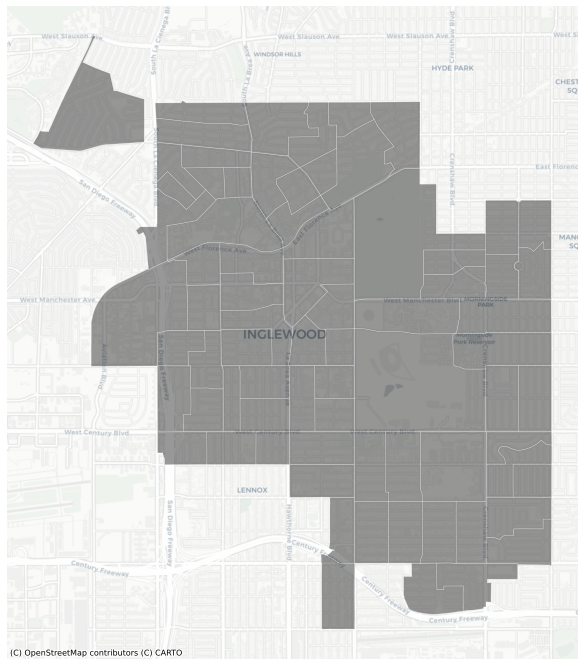

In [16]:
fig, ax = plt.subplots(figsize=(12,12))

gdf.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

I plot the census blocks from the income data set, so that later I can use this same map to plot other data onto it.

#### Part 2: Socrata Data - LA County Assessor Parcels

For this second part of the notebook, I will be using data from the LA County Assessor. I begin by pulling the data directly from the Socrata API.

In [17]:
client = Socrata("data.lacounty.gov", None)

results = client.get("42ne-gwcj",
                    limit=50000,
                    where="taxratearea_city='INGLEWOOD' AND rollyear=2020 AND yearbuilt between 1950 and 2020")

df = pd.DataFrame.from_records(results)

df.sample(1)

,usecodedescchar1,roll_homeownersexemp,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,situscity,...,bathrooms,sqftmain,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,situsunit,parcelclassification,situsfraction
8326,Residential,0,20040917,1964,Y,433336,0,TRACT NO 29317 LOT 24,2005,INGLEWOOD CA,...,2,1595,W,0,33.959719849999999,90305-4024,1964,UNIT 24,NaN,NaN


In [18]:
df.shape

(9321, 51)

I check to make sure that the shape of the data makes sense according to the filters I appplied when pulling the data. 

In [19]:
df = gpd.GeoDataFrame(df, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df.center_lon, df.center_lat))

The data is pulled as a dataframe, but I want to convert it to a geodataframe so that I can use it for mapping later on.

In [20]:
# get the layers into a web mercator projection
# reproject to web mercator
df = df.to_crs(epsg=3857)

I project it to web mercator so the layers can be placed on to a basemap.

In [21]:
df.center_lon = df.center_lon.astype('float')
df.center_lat = df.center_lat.astype('float')

I convert the longtiude and longitude columns into floats so that they are able to be plotted.

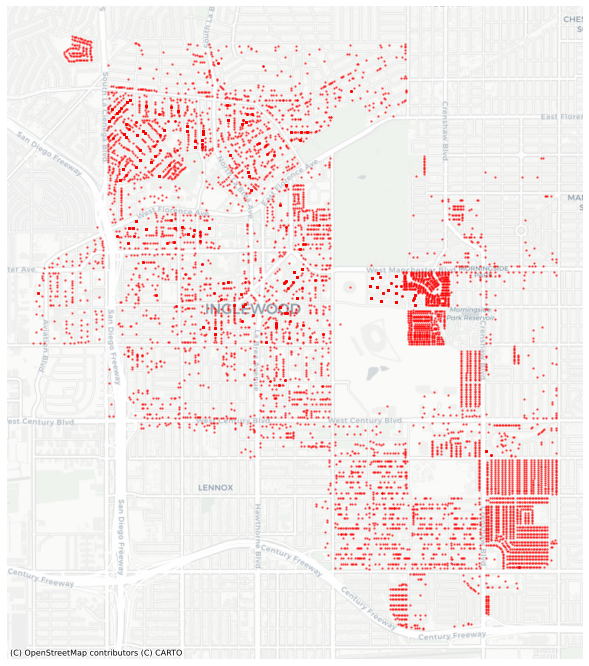

In [22]:
fig,ax = plt.subplots(figsize=(12,12))

df.plot(ax=ax,
             color='red',
             markersize=2, alpha=0.5)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

I now have plotted the properties that have been built between 1950 and 2020. I change the alpha level so that I can see where the heaviest concentration of construction has occurred during that time.

In [23]:
# get the bounding box coordinates for the data
minx, miny, maxx, maxy = df.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13177839.035214463
-13171101.003359718
4018790.6680033994
4026432.0829736413


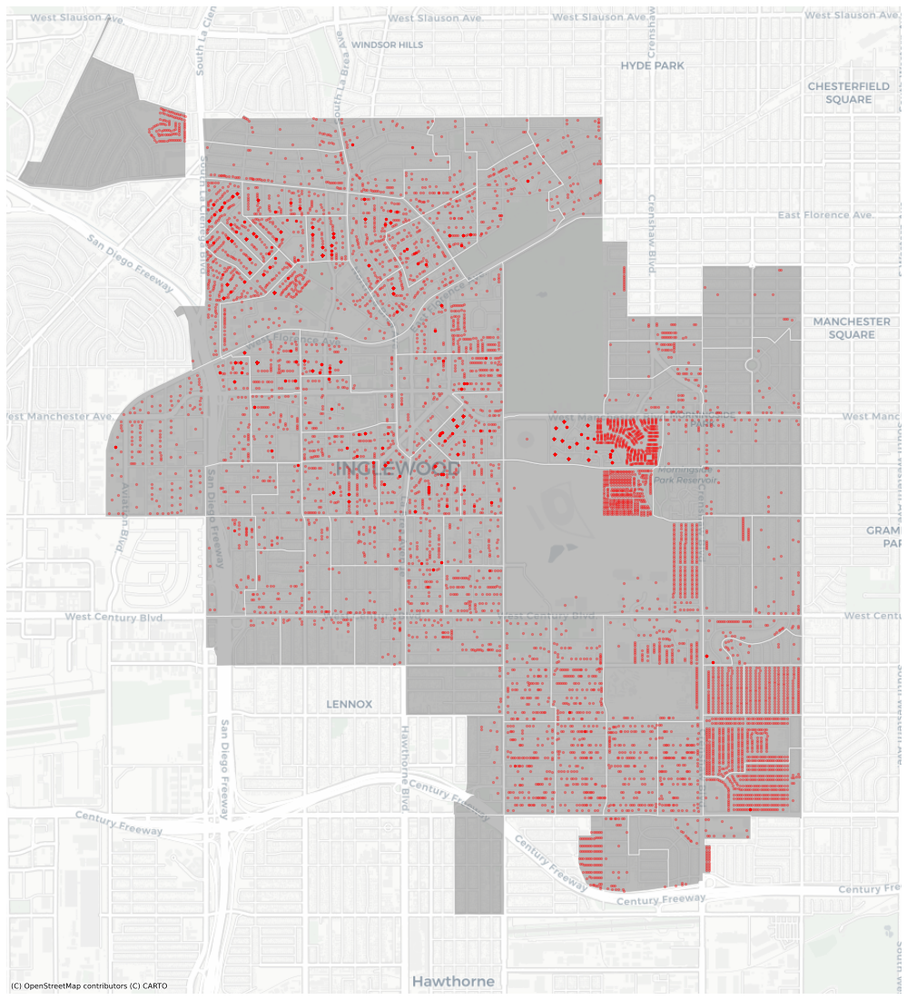

In [24]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(20, 20))

# block groups
gdf.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.5)

# properties built in Inglewood between 1950-2020
df.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=5,
            alpha=0.3)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

I now have plotted the same data but with the census block layer underneath it so that I can visualize which census block group has experienced the most construction during that time period. 

For the final it might be useful to adjust the time periods that might be more closely related to the development of SoFi stadium.

In [25]:
# Do the spatial join
join = gpd.sjoin(df, gdf, how='left')
join.head()

,usecodedescchar1,roll_homeownersexemp,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,situscity,...,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above","Percent Less than $35,000","Percent $35,000 to 59,999","Percent $60,000 to 99,999","Percent $100,000 to 149,999,","Percent $150,000 and above"
0,Commercial,0,20191009,1971,Y,92255,0,TRACT NO 7250 LOTS 255 AND LOT 256,1976,INGLEWOOD CA,...,95.0,93.0,101.0,78.0,95.0,20.562771,20.129870,21.861472,16.883117,20.562771
1,Residential,7000,20040402,1965,Y,254791,0,*TR=40866 LOT 1 CONDOMINIUM*UNIT 5,2004,INGLEWOOD CA,...,178.0,181.0,99.0,165.0,97.0,24.722222,25.138889,13.750000,22.916667,13.472222
2,Residential,0,20181228,1967,Y,1461195,0,TRACT # 9144 LOT 144,2010,INGLEWOOD CA,...,58.0,32.0,89.0,38.0,54.0,21.402214,11.808118,32.841328,14.022140,19.926199
3,Residential,7000,20171027,1963,Y,816713,0,TRACT # 9576 LOT 259,2018,INGLEWOOD CA,...,58.0,32.0,89.0,38.0,54.0,21.402214,11.808118,32.841328,14.022140,19.926199
4,Commercial,0,19910612,1950,Y,519497,0,TRACT # 7250 LOTS 239 AND LOT 240,1991,INGLEWOOD CA,...,178.0,181.0,99.0,165.0,97.0,24.722222,25.138889,13.750000,22.916667,13.472222


I now have joined the income data with the la county assessor parcel data, and have the data frame to explore each census block group's parcel data in relation to the income data.

In [26]:
properties_built_by_gdf = join.geoid.value_counts().rename_axis('geoid').reset_index(name='total_properties_built')
properties_built_by_gdf.head(20)

,geoid,total_properties_built
0,15000US060376007031,953
1,15000US060376007023,563
2,15000US060376013022,407
3,15000US060376005011,371
4,15000US060376010023,333
5,15000US060376005012,298
6,15000US060376013031,287
7,15000US060376013024,286
8,15000US060376014013,270
9,15000US060376009024,249


I create a data frame to see the number of total properties built per census block.

<AxesSubplot:xlabel='geoid'>

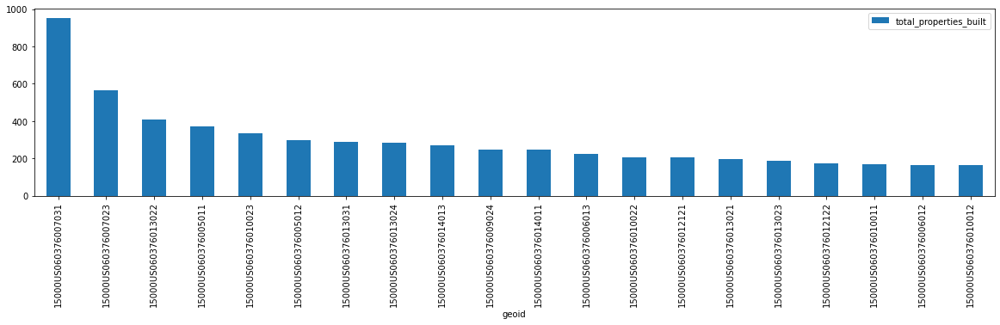

In [27]:
# make a bar chart of top 20 geographies
properties_built_by_gdf[:20].plot.bar(figsize=(20,4),
                             x='geoid',
                             y='total_properties_built')

I create a bar graph of the top census block groups that have expeperienced the most construction, but the x axis makes it difficult to follow.

In [28]:
gdf=gdf.merge(properties_built_by_gdf,on='geoid')

Instead, I will merge the data frames I have.

In [29]:
gdf.head()

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry,"Percent Less than $35,000","Percent $35,000 to 59,999","Percent $60,000 to 99,999","Percent $100,000 to 149,999,","Percent $150,000 and above",total_properties_built
0,15000US060376005011,"Block Group 1, Los Angeles, CA",449.0,86.0,101.0,110.0,84.0,68.0,"MULTIPOLYGON (((-13172036.265 4020510.300, -13...",19.153675,22.494432,24.498886,18.708241,15.144766,371
1,15000US060376005012,"Block Group 2, Los Angeles, CA",422.0,117.0,52.0,95.0,75.0,83.0,"MULTIPOLYGON (((-13172036.822 4019799.179, -13...",27.725118,12.322275,22.511848,17.772512,19.668246,298
2,15000US060376005021,"Block Group 1, Los Angeles, CA",334.0,73.0,51.0,73.0,82.0,55.0,"MULTIPOLYGON (((-13172766.298 4019470.333, -13...",21.856287,15.269461,21.856287,24.550898,16.467066,55
3,15000US060376005022,"Block Group 2, Los Angeles, CA",301.0,53.0,70.0,65.0,68.0,45.0,"MULTIPOLYGON (((-13173255.659 4019132.509, -13...",17.607973,23.255814,21.594684,22.591362,14.950166,121
4,15000US060376006011,"Block Group 1, Los Angeles, CA",271.0,54.0,59.0,96.0,35.0,27.0,"MULTIPOLYGON (((-13172035.820 4021123.242, -13...",19.926199,21.771218,35.424354,12.915129,9.963100,67


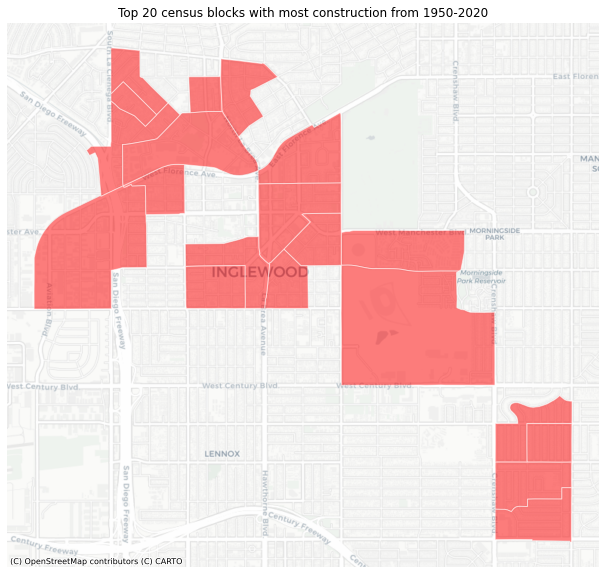

In [30]:
# map the top 20 census blocks that have experienced the most construction from 1950-2020
fig,ax = plt.subplots(figsize=(12,10))
gdf.sort_values(by='total_properties_built',ascending=False)[:20].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)


# title
ax.set_title('Top 20 census blocks with most construction from 1950-2020')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now that the data frames have been merged I can visually see the top areas in Inglewood that have experienced the most construction.

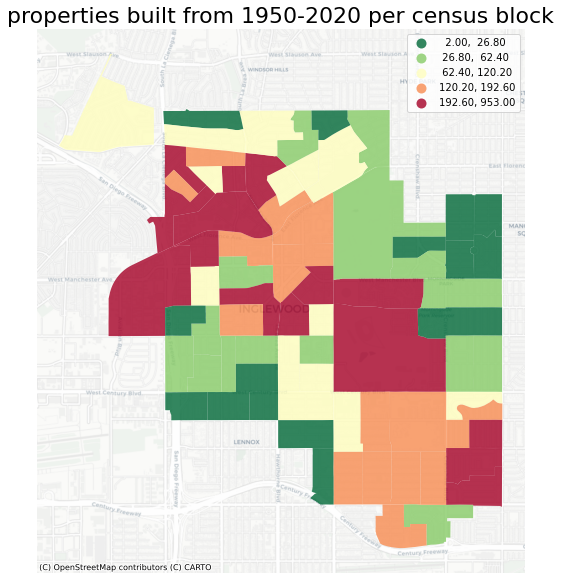

In [31]:
fig,ax = plt.subplots(figsize=(12,10))

gdf.plot(ax=ax,
        column='total_properties_built',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='quantiles')

ax.axis('off')
ax.set_title('properties built from 1950-2020 per census block',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

I create a similar map that includes the entire city that color codes the amount of total construction each block group has experienced from 1950-2020.

In [32]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf,k=8)

# Row-standardization
wq.transform = 'r'

Now I want to begin seeing what the spatial weight is of the data exploration I have conducted up to this point. Next I will create a column for spatial lag for total properties built.

In [33]:
# create a new column for the spatial lag
gdf['total properties built_lag'] = lps.weights.lag_spatial(wq, gdf['total_properties_built'])

In [34]:
gdf.sample(10)[['geoid','Total','total_properties_built','total properties built_lag']]

,geoid,Total,total_properties_built,total properties built_lag
50,15000US060376013024,994.0,286,202.625
22,15000US060376009022,577.0,101,147.125
62,15000US060376015012,771.0,6,29.125
63,15000US060376017002,459.0,11,88.875
44,15000US060376012122,937.0,175,82.625
11,15000US060376007031,874.0,953,143.875
48,15000US060376013022,911.0,407,160.000
19,15000US060376008022,309.0,25,139.875
5,15000US060376006012,419.0,167,160.000
28,15000US060376009122,571.0,74,88.000


In [35]:
gdf['total properties built_lag_diff'] = gdf['total_properties_built'] - gdf['total properties built_lag']

I have the spatial lag, but I also want to see what the difference is between total properties built and the spatial laf for properties built.

In [36]:
gdf.sort_values(by='total properties built_lag_diff')

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry,"Percent Less than $35,000","Percent $35,000 to 59,999","Percent $60,000 to 99,999","Percent $100,000 to 149,999,","Percent $150,000 and above",total_properties_built,total properties built_lag,total properties built_lag_diff
32,15000US060376010021,"Block Group 1, Los Angeles, CA",536.0,175.0,104.0,166.0,91.0,0.0,"MULTIPOLYGON (((-13174410.933 4022994.072, -13...",32.649254,19.402985,30.970149,16.977612,0.000000,64,260.625,-196.625
18,15000US060376008021,"Block Group 1, Los Angeles, CA",320.0,65.0,34.0,103.0,44.0,74.0,"MULTIPOLYGON (((-13173999.384 4024930.176, -13...",20.312500,10.625000,32.187500,13.750000,23.125000,45,234.750,-189.750
45,15000US060376013011,"Block Group 1, Los Angeles, CA",271.0,58.0,32.0,89.0,38.0,54.0,"MULTIPOLYGON (((-13176926.085 4026336.456, -13...",21.402214,11.808118,32.841328,14.022140,19.926199,25,186.875,-161.875
52,15000US060376013032,"Block Group 2, Los Angeles, CA",444.0,88.0,166.0,83.0,102.0,5.0,"MULTIPOLYGON (((-13176470.343 4025376.634, -13...",19.819820,37.387387,18.693694,22.972973,1.126126,91,227.500,-136.500
2,15000US060376005021,"Block Group 1, Los Angeles, CA",334.0,73.0,51.0,73.0,82.0,55.0,"MULTIPOLYGON (((-13172766.298 4019470.333, -13...",21.856287,15.269461,21.856287,24.550898,16.467066,55,190.750,-135.750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,15000US060376014013,"Block Group 3, Los Angeles, CA",604.0,168.0,237.0,54.0,78.0,67.0,"MULTIPOLYGON (((-13177873.303 4022676.676, -13...",27.814570,39.238411,8.940397,12.913907,11.092715,270,116.375,153.625
0,15000US060376005011,"Block Group 1, Los Angeles, CA",449.0,86.0,101.0,110.0,84.0,68.0,"MULTIPOLYGON (((-13172036.265 4020510.300, -13...",19.153675,22.494432,24.498886,18.708241,15.144766,371,151.000,220.000
48,15000US060376013022,"Block Group 2, Los Angeles, CA",911.0,274.0,46.0,347.0,146.0,98.0,"MULTIPOLYGON (((-13176901.261 4025750.619, -13...",30.076839,5.049396,38.090011,16.026345,10.757409,407,160.000,247.000
10,15000US060376007023,"Block Group 3, Los Angeles, CA",766.0,139.0,88.0,86.0,193.0,260.0,"MULTIPOLYGON (((-13173985.803 4022454.303, -13...",18.146214,11.488251,11.227154,25.195822,33.942559,563,191.875,371.125


In [37]:
# the geoid with highest negative difference
gdf_donut = gdf.sort_values(by='total properties built_lag_diff').head(1)
gdf_donut

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry,"Percent Less than $35,000","Percent $35,000 to 59,999","Percent $60,000 to 99,999","Percent $100,000 to 149,999,","Percent $150,000 and above",total_properties_built,total properties built_lag,total properties built_lag_diff
32,15000US060376010021,"Block Group 1, Los Angeles, CA",536.0,175.0,104.0,166.0,91.0,0.0,"MULTIPOLYGON (((-13174410.933 4022994.072, -13...",32.649254,19.402985,30.970149,16.977612,0.0,64,260.625,-196.625


In [38]:
# the geoid with highest positive difference
gdf_diamond = gdf.sort_values(by='total properties built_lag_diff').tail(1)
gdf_diamond

,geoid,name,Total,"less than $35,000","$35,000 to 59,999","$60,000 to 99,999","$100,000 to 149,999","$150,000 and above",geometry,"Percent Less than $35,000","Percent $35,000 to 59,999","Percent $60,000 to 99,999","Percent $100,000 to 149,999,","Percent $150,000 and above",total_properties_built,total properties built_lag,total properties built_lag_diff
11,15000US060376007031,"Block Group 1, Los Angeles, CA",874.0,176.0,168.0,214.0,185.0,131.0,"MULTIPOLYGON (((-13173985.915 4023092.312, -13...",20.1373,19.221968,24.485126,21.167048,14.988558,953,143.875,809.125


In [39]:
# set the mapbox access token
token = 'pk.eyJ1IjoibmVsc29uZzk1IiwiYSI6ImNrdngyM290ZTBhamoycG1xcW0yaDM4a2UifQ.dcDoRv1OD43wF5aesZohcA'
px.set_mapbox_access_token(token)

In [40]:
# subset donut, project to WGS84, and get its centroid
gdf_donut = gdf_donut.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_donut.geometry.total_bounds
center_lat_donut = (maxy-miny)/2+miny
center_lon_donut = (maxx-minx)/2+minx

In [41]:
# subset diamond, project to WGS84, and get its centroid
gdf_diamond = gdf_diamond.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_diamond.geometry.total_bounds
center_lat_diamond = (maxy-miny)/2+miny
center_lon_diamond = (maxx-minx)/2+minx

Now that I have the donut and diamond I will create to individual maps for each.

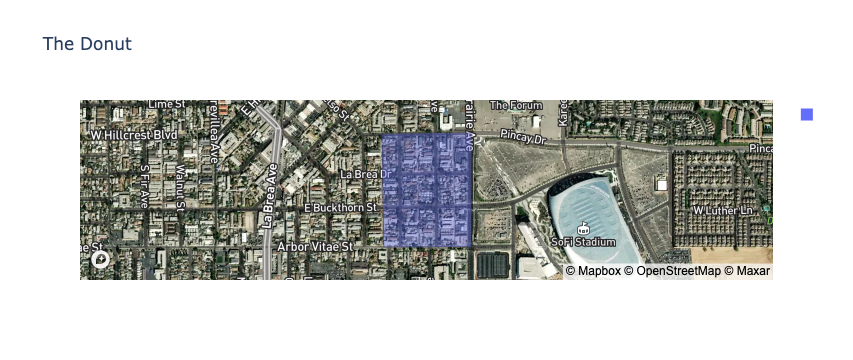

In [42]:
px.choropleth_mapbox(gdf_donut, 
                     geojson=gdf_donut.geometry, 
                     locations=gdf_donut.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_donut, "lon": center_lon_donut},
                     hover_data=['geoid','Total','total_properties_built','total properties built_lag'],
                     opacity=0.4,
                     title='The Donut')

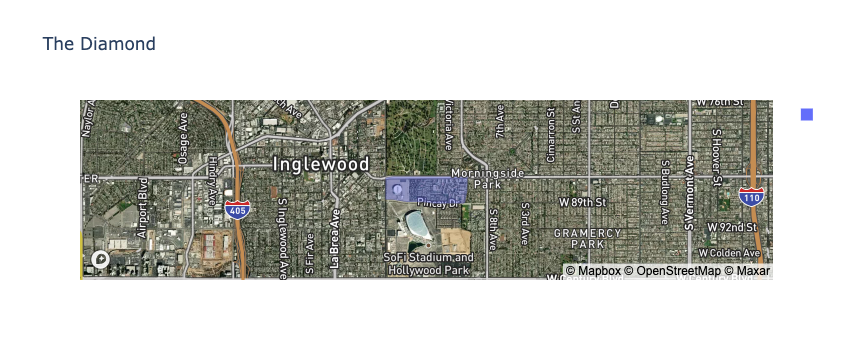

In [43]:
px.choropleth_mapbox(gdf_diamond, 
                     geojson=gdf_diamond.geometry, 
                     locations=gdf_diamond.index, 
                     mapbox_style="satellite-streets",
                     zoom=12, 
                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},
                     hover_data=['geoid','Total','total_properties_built','total properties built_lag'],
                     opacity=0.4,
                     title='The Diamond')

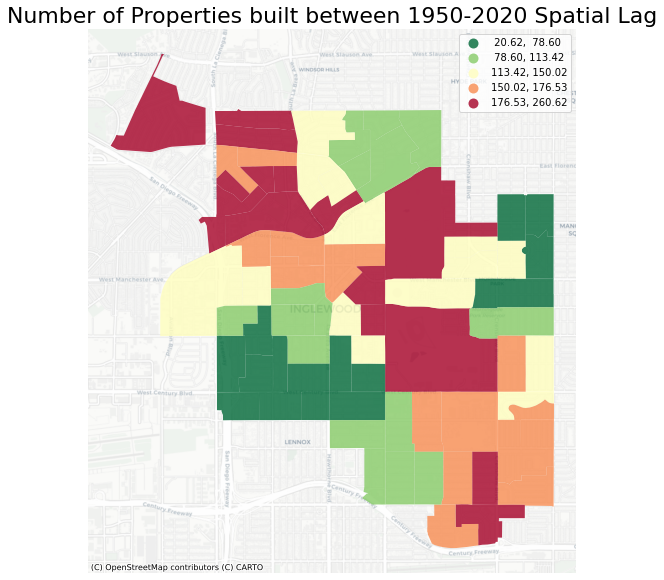

In [44]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(12, 10))

# spatial lag choropleth
gdf.plot(ax=ax,
         figsize=(15,15),
         column='total properties built_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('Number of Properties built between 1950-2020 Spatial Lag',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

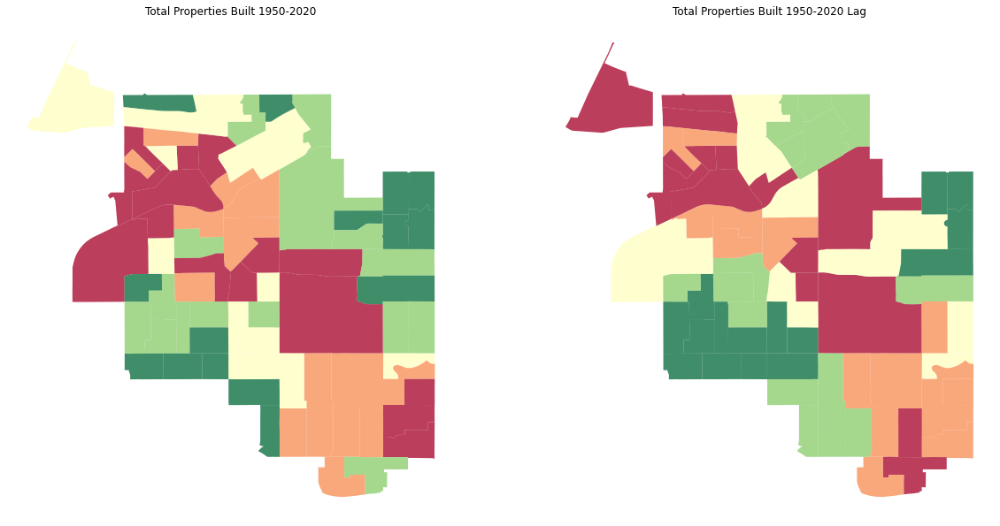

In [45]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='total_properties_built', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Total Properties Built 1950-2020")

# spatial lag map on the right
gdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='total properties built_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Total Properties Built 1950-2020 Lag")

plt.show()

In [46]:
# interactive version needs to be in WGS84
gdf_web = gdf.to_crs('EPSG:4326')

In [47]:
# what's the centroid?
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [48]:
# some stats
gdf_web.total_properties_built.describe()

count     74.000000
mean     125.959459
std      145.892665
min        2.000000
25%       32.750000
50%       78.500000
75%      166.500000
max      953.000000
Name: total_properties_built, dtype: float64

In [49]:
# grab the median
median = gdf_web.total_properties_built.median()

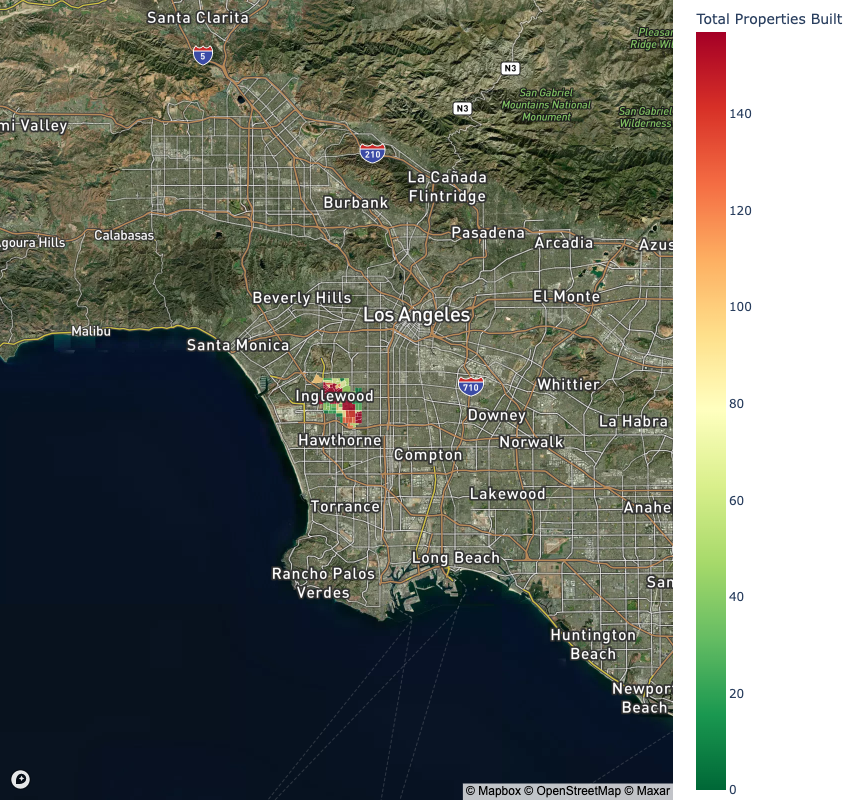

In [50]:
fig = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, # the geometry column
                     locations=gdf_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='total_properties_built',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median, # put the median as the midpoint
                     range_color =(0,median*2),
                     hover_data=['geoid','Total','total_properties_built','total properties built_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'total properties built_lag':'Total Properties Built(Spatial Lag)',
                             'total_properties_built':'Total Properties Built',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [51]:
y = gdf.total_properties_built
moran = Moran(y, wq)
moran.I

0.14304266071640334

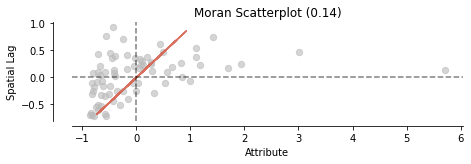

In [52]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

(<Figure size 504x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.14', ylabel='Density'>)

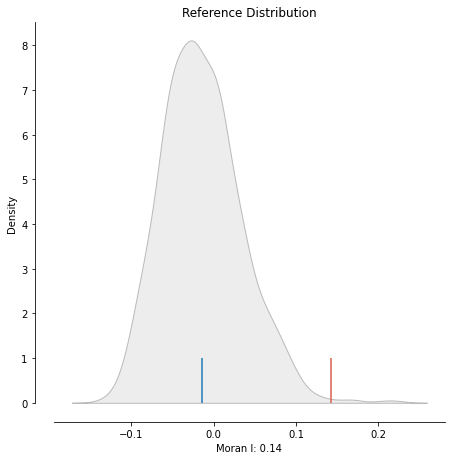

In [53]:
plot_moran_simulation(moran,aspect_equal=False)

In [54]:
moran.p_sim

0.006

In [55]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

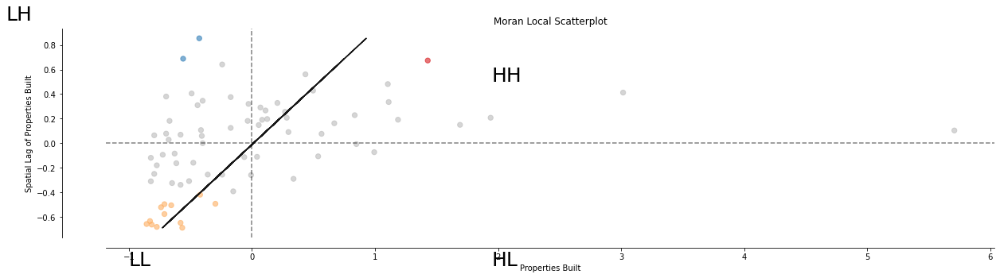

In [56]:
# Plot
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Properties Built")
ax.set_ylabel('Spatial Lag of Properties Built')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

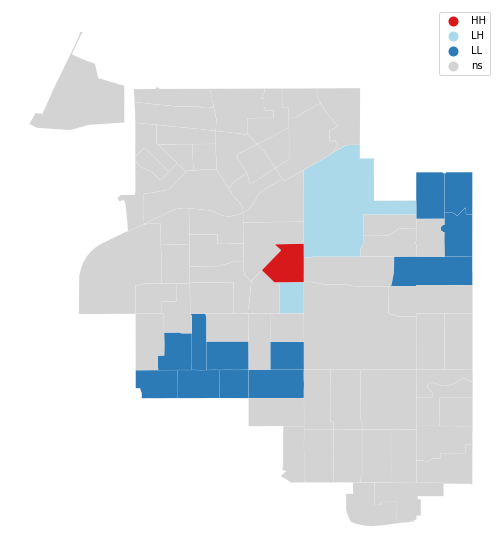

In [57]:
fig, ax = plt.subplots(figsize=(12,10))
lisa_cluster(lisa, gdf, p=0.05, ax=ax)
plt.show()

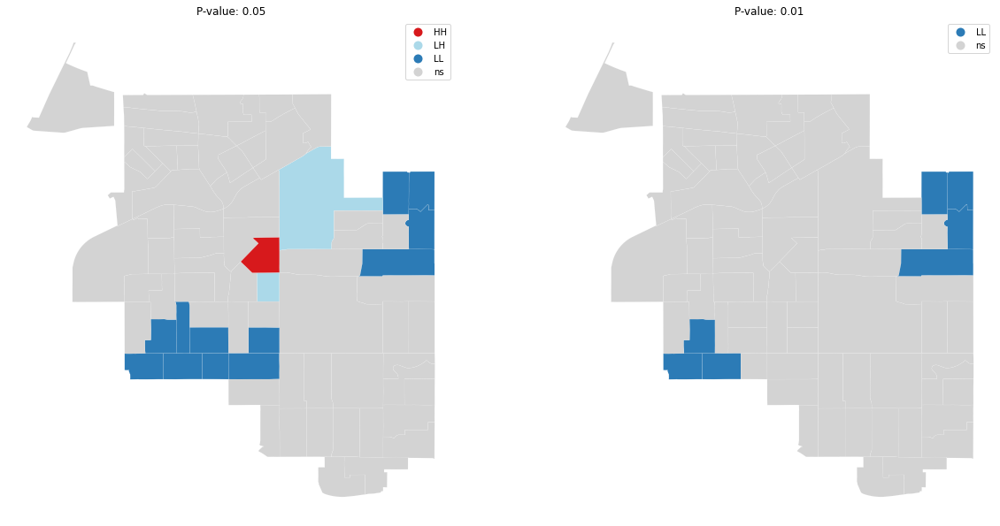

In [58]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, gdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()